In [14]:
import os
import numpy as np
import pandas as pd

ncedc_pick_dir = '../data/NCEDC_picks'

file_list = [f'{year}.txt' for year in range(2008, 2024)]
print(file_list)

['2008.txt', '2009.txt', '2010.txt', '2011.txt', '2012.txt', '2013.txt', '2014.txt', '2015.txt', '2016.txt', '2017.txt', '2018.txt', '2019.txt', '2020.txt', '2021.txt', '2022.txt', '2023.txt']


# NCEDC picks to a Dictionary

In [15]:
my_dict = {}
current_event = None
current_event_params = []
line_len = []

for file in file_list[:]:
    with open (f'{ncedc_pick_dir}/{file}', 'r') as f:
        lines = f.readlines()
        for i, line in enumerate(lines): 
            line_len.append(len(line))

            ### Separate event header and station picks by line length ###
            if len(line) >= 170: # event header

                if current_event is not None:   
                    my_dict[current_event] = current_event_params

                eymd = line[0:4] + '-' + line[4:6] + '-' + line[6:8]
                edts = line[8:10] + ':' + line[10:12] + ':' + line[12:14] + '.' + line[14:16]
                etime = eymd + 'T' + edts
                elat = float(line[16:18].strip()) + float(line[19:23].strip())/100/60 # /100: F4.2, /60: min to deg
                elon = float(line[23:27].strip()) + float(line[27:31].strip())/100/60
                edep = np.float32(line[31:36].strip())/100
                eid = 'nc' + line[136:146].strip()
                emag = float(line[147:150].strip())/100 # F3.2

                evparams = [eid, etime, elat, elon, edep, emag]
                current_event = eid
                current_event_params = [] # reset for the next event

            elif len(line) == 121: # station picks
                stcode = line[0:5].strip()
                net = line[5:7].strip()
                cha = line[9:12].strip()
                phase_type = line[14:15].strip()
                polarity = line[15:16].strip()
                sec_str = line[29:34].strip()
                if sec_str == '' or phase_type == '':
                    continue
                sec = float(sec_str)/100
                phase_time = f'{line[17:21]}-{line[21:23]}-{line[23:25]}T{line[25:27]}:{line[27:29]}:{sec}'

                evstnparams = evparams + [f'{net}.{stcode}..{cha}', phase_type, polarity, phase_time]
                current_event_params.append(evstnparams)

                if i == len(lines)-2: # last line -1 , so save the last event
                    my_dict[current_event] = current_event_params
            
            else:
                # print(line, len(line))
                pass

print(len(list(my_dict.keys())))
print(list(my_dict.keys())[-10:])

for line in my_dict[list(my_dict.keys())[-1]]:
  print(line)
  break


7312
['nc73979931', 'nc73980066', 'nc73980546', 'nc73980711', 'nc73981126', 'nc73981181', 'nc73981716', 'nc73981981', 'nc73982056', 'nc73982061']
['nc73982061', '2023-12-28T12:03:26.22', 40.4025, 125.10833333333333, 10.0, 3.5, 'BG.AL1..DPZ', 'P', '', '2023-12-28T12:04:2.73']


# Convert into a Dataframe 

In [16]:
df_list = []
# put the dict into a dataframe
for k, v in my_dict.items():
    temp_df = pd.DataFrame(v, 
            columns=['event_id', 'etime', 'elat', 'elon', 'edep', 'emag', 'station_id', 'phase_type', 'phase_polarity', 'phase_time'])
    df_list.append(temp_df)

# combine the dataframes into one
master_df = pd.concat(df_list)

# convert lat and lon to float and round to 7 decimal places and times to datetime
master_df['elat'] = master_df['elat'].astype(float)
master_df['elon'] = master_df['elon'].astype(float) * -1
master_df['etime'] = pd.to_datetime(master_df['etime'])
master_df['phase_time'] = pd.to_datetime(master_df['phase_time'])

# filter out events outside of the region of interest
master_df = master_df[
    (master_df['elat'] >= 39.75) & (master_df['elat'] <= 41.5) 
    & (master_df['elon'] >= -125.5) & (master_df['elon'] <= -123)]

# keep only picks ending with 'Z' or '3'
master_df = master_df[master_df['station_id'].str.endswith(('Z', '3'))]

# write to csv
master_df.to_csv(f'{ncedc_pick_dir}/NCEDC_picks_50km.csv', index=False)

print(master_df.shape)
master_df.head()

(253161, 10)


,event_id,etime,elat,elon,edep,emag,station_id,phase_type,phase_polarity,phase_time
0,nc51193680,2008-01-01 05:58:18.290,40.7805,-123.561333,20.32,2.04,BK.JCC..HHZ,P,U,2008-01-01 05:58:26.220
1,nc51193680,2008-01-01 05:58:18.290,40.7805,-123.561333,20.32,2.04,BK.WDC..HHZ,P,U,2008-01-01 05:58:33.060
2,nc51193680,2008-01-01 05:58:18.290,40.7805,-123.561333,20.32,2.04,NC.KBS..SHZ,P,D,2008-01-01 05:58:34.270
3,nc51193680,2008-01-01 05:58:18.290,40.7805,-123.561333,20.32,2.04,NC.KCR..SHZ,P,U,2008-01-01 05:58:27.140
4,nc51193680,2008-01-01 05:58:18.290,40.7805,-123.561333,20.32,2.04,NC.KCS..SHZ,P,U,2008-01-01 05:58:24.930


# Make a Catalog

In [17]:
#extract events catalog from picks df
eq_df = master_df[['event_id', 'etime', 'elat', 'elon', 'edep', 'emag']].drop_duplicates(subset='event_id').reset_index(drop=True)
eq_df.to_csv(f'{ncedc_pick_dir}/NCEDC_eq_cat_50km.csv', index=False)
eq_df.head()

,event_id,etime,elat,elon,edep,emag
0,nc51193680,2008-01-01 05:58:18.290,40.780500,-123.561333,20.32,2.04
1,nc71092841,2008-01-06 05:52:36.260,40.481667,-124.594000,20.24,2.44
2,nc71093761,2008-01-13 02:34:14.790,40.882667,-123.681667,11.23,2.23
3,nc71093956,2008-01-14 09:30:08.410,40.627333,-124.247333,13.45,1.81
4,nc51194589,2008-01-14 19:11:31.050,40.779833,-123.564000,22.51,2.50


# Above slab2 interface events

In [18]:
from scipy.interpolate import griddata

cat_folder = f"../data/eq_data/1_eq_catalogs"
# slab2_file = f"{cat_folder}/slab2_subset.csv"
slab2_nonan_file = f"{cat_folder}/slab2_subset_no_nan.csv"

# Load data
slab2_no_nan = pd.read_csv(slab2_nonan_file)

# intepolate slab depth to the earthquake locations
# and add the slab depth to the eq_df as a new column
eq_df['slab_depth'] = griddata(
    (slab2_no_nan['lon'], slab2_no_nan['lat']), 
    slab2_no_nan['depth'], 
    (eq_df['elon'], eq_df['elat']), method='linear'
    )

# select earthquakes with slab_depth column is not NaN
eq_in_slab2_area_df = eq_df[~np.isnan(eq_df['slab_depth'])] # ~ means not

# make slab_depth column positive because earthquake depth are also positive
eq_in_slab2_area_df.loc[:, 'slab_depth'] = -eq_in_slab2_area_df.slab_depth

# get above slab earthquakes i.e. eq depth < slab depth
above_slab_eq_df = eq_in_slab2_area_df[
    eq_in_slab2_area_df['edep'] < eq_in_slab2_area_df['slab_depth']
    ]

above_slab_eq_df.to_csv(f'{ncedc_pick_dir}/NCEDC_eq_cat_above_slab.csv', index=False)

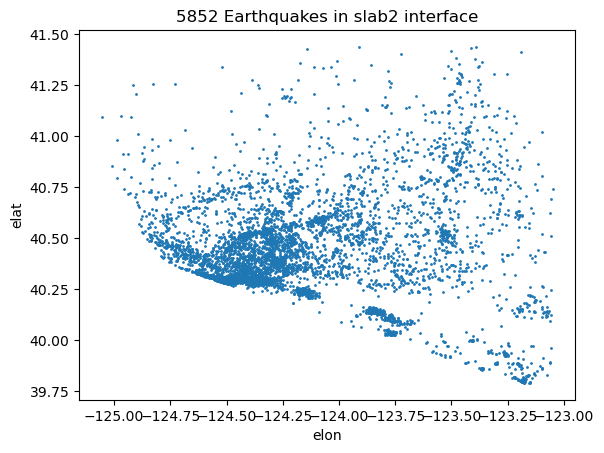

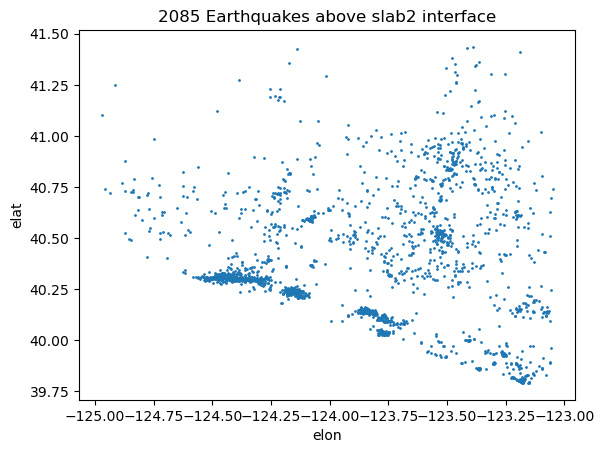

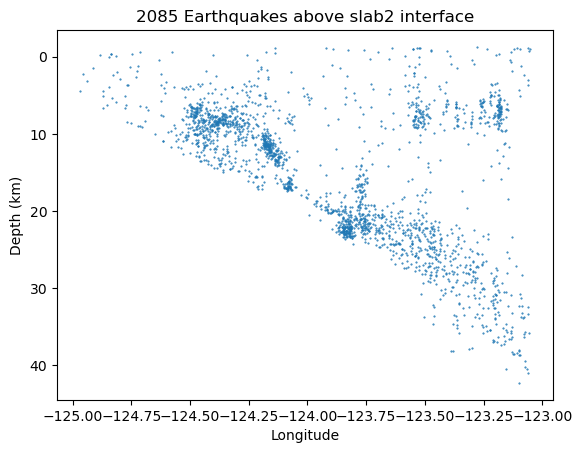

In [19]:

# plot
ax = eq_in_slab2_area_df.plot.scatter(x='elon', y='elat', s=1)
ax.set_title(f'{eq_in_slab2_area_df.shape[0]} Earthquakes in slab2 interface')

ax = above_slab_eq_df.plot.scatter(x='elon', y='elat', s=1)
ax.set_title(f'{above_slab_eq_df.shape[0]} Earthquakes above slab2 interface')

# cross section
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.plot(above_slab_eq_df.elon, above_slab_eq_df.edep, '.', markersize=1)
ax.invert_yaxis()
ax.set_xlabel('Longitude'), ax.set_ylabel('Depth (km)')
ax.set_title(f'{above_slab_eq_df.shape[0]} Earthquakes above slab2 interface')
plt.show()

# Finally, convert into PyRocko format phase picks file

In [20]:
import random, string
random.seed(42)

# select picks for above slab earthquakes
above_slab_picks_df = master_df[master_df['event_id'].isin(above_slab_eq_df['event_id'])]
above_slab_picks_df = above_slab_picks_df.sort_values(['etime', 'event_id']).reset_index(drop=True)
above_slab_picks_df.to_csv(f'{ncedc_pick_dir}/NCEDC_picks_above_slab.csv', index=False)

# group by year of the event
above_slab_picks_df['year'] = above_slab_picks_df['etime'].dt.year

for iyear, year_df in above_slab_picks_df.groupby('year'):
    year_df.to_csv(f'{ncedc_pick_dir}/{iyear}_NCEDC_picks_above_slab.csv', index=False)
    pyrocko_fmt = []
    # convert the dataframe to PyRocko format text file
    for ig, groupdf in above_slab_picks_df.groupby('event_id'):

        # generate 27 char random string
        random_string = ''.join(random.choices(string.ascii_letters + string.digits, k=27)) + '='
        
        # event line
        etime_formatted = pd.to_datetime(groupdf.iloc[0]['etime']).strftime('%Y-%m-%d %H:%M:%S.%f')[:-2]
        event_line = f"event: {etime_formatted}  0 {random_string}   "
        event_line += f"{groupdf.iloc[0]['elat']:.7f} {groupdf.iloc[0]['elon']:.7f}         "
        event_line += f"{groupdf.iloc[0]['edep']:.2f} {groupdf.iloc[0]['emag']:.2f} None  {groupdf.iloc[0]['event_id']} None\n" # dep, mag, ???, event_id, ???
        
        pyrocko_fmt.append(event_line)
        # print((event_line))

        for i, row in groupdf.iterrows(): 
            phase_time_obj = pd.to_datetime(row['phase_time'])
            part1 = f"phase: {phase_time_obj.strftime('%Y-%m-%d %H:%M:%S.%f')[:-2]}  0 "
            part2 = f"{row.station_id.ljust(15)}  {random_string} {etime_formatted} "
            if row.phase_polarity == 'U':
                polarity = 1
            elif row.phase_polarity == 'D':
                polarity = -1
            else:
                polarity = 'None'
            part3 = f"{row.phase_type}          {str(polarity).rjust(4)} False\n"

            phase_line = part1 + part2 + part3
            
            pyrocko_fmt.append(phase_line)


    with open(f'{ncedc_pick_dir}/NCEDC_picks_above_slab_pyrocko.txt', 'w') as f:
        f.write('# Snuffler Markers File Version 0.2\n')
        f.writelines(pyrocko_fmt)

In [21]:
import pyperclip
marker_file = f'{ncedc_pick_dir}/NCEDC_picks_above_slab_pyrocko.txt'
station_xml = f'../data/eq_data/3_station_catalogs/00_station_inventory_master_cleaned.xml'
cmd = f"snuffler *.mseed --stationxml={os.path.abspath(station_xml)} --markers={os.path.abspath(marker_file)}" #--event=00_master_event_file_PyRocko.txt
pyperclip.copy(cmd)
print(f"go to mseed folder.\nCommand is copied to clipboard:\n {cmd}")

go to mseed folder.
Command is copied to clipboard:
 snuffler *.mseed --stationxml=/Users/mdarifulislam/Library/CloudStorage/OneDrive-IndianaUniversity/Research/Github/FM2STRESS/FM2STRESS_project/data/eq_data/3_station_catalogs/00_station_inventory_master_cleaned.xml --markers=/Users/mdarifulislam/Library/CloudStorage/OneDrive-IndianaUniversity/Research/Github/FM2STRESS/FM2STRESS_project/data/NCEDC_picks/NCEDC_picks_above_slab_pyrocko.txt


['HHZ' 'SHZ' 'EHZ' 'HNZ' 'DPZ' 'BHZ' 'SLZ' 'CNZ' 'HN3' 'HH3' 'ENZ']


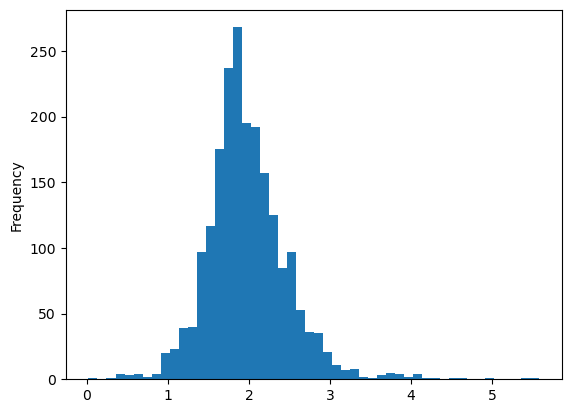

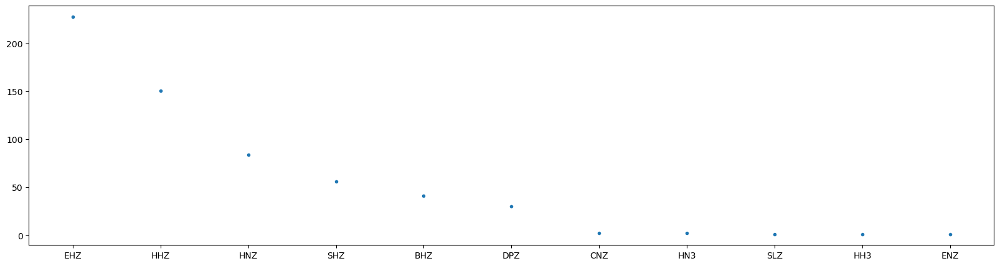

In [1]:
import pandas as pd
import numpy as np

ncedc_eqcat_df = pd.read_csv(f'../data/NCEDC_picks/NCEDC_eq_cat_above_slab.csv')
ncedc_eqcat_df.emag.plot(kind='hist', bins=50)

ncedc_picks_df = pd.read_csv(f'../data/NCEDC_picks/NCEDC_picks_above_slab.csv')
# unique channels
stnid = list(ncedc_picks_df.station_id.unique())
cha_list = [stn.split('.')[-1] for stn in stnid]
# cha_list = np.array(list(set(cha_list)))
cha_freq = pd.DataFrame(cha_list, columns=['channels'])
print(cha_freq.channels.unique())

# plot the frequency of each channel
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(20, 5))
ax.plot(cha_freq.channels.value_counts(), '.')
plt.show()


# Download data
['HHZ', 'BHZ', 'HNZ', 'EHZ', 'SHZ', 'DPZ', 'SLZ', 'CNZ', 'HN3', 'HH3', 'ENZ']
these are the channels for which ncedc have picks. So we use these channels and the 1st four 
broadband channels from our previous priority channels.

In [57]:
import os
import pandas as pd
import numpy as np
import obspy
from obspy.clients.fdsn import Client
from obspy import UTCDateTime, read, read_inventory, Stream


def GetWF1client(client_name, row, channels_string):
    client = Client(client_name)
    inventory = client.get_stations(
        network='*',
        station='*',
        location='*',
        channel=channels_string,
        latitude=row.elat,
        longitude=row.elon,
        # approx. 200 km radius
        maxradius=1.5, #degree
        starttime=UTCDateTime(row.etime) - 30,
        endtime=UTCDateTime(row.etime) + 110,
        level='channel',
    )
    
    stations = []
    for net in inventory.networks:
        for stn in net:
            stations.append(stn.code)
    valid_channels = list(set([i[-3:] for i in inventory.get_contents()['channels']]))
    
    print(inventory.get_contents()['networks'])
    print(stations)
    print(valid_channels)

    # inventory.plot(projection='local', resolution='i')
    st = client.get_waveforms(
        network=",".join(inventory.get_contents()['networks']),
        station=",".join(stations),
        location="*",
        channel=",".join(valid_channels),
        starttime=UTCDateTime(row.etime) - 30,
        endtime=UTCDateTime(row.etime) + 120,
    )
    print('Download complete for ', client_name)

    return st, inventory



ncedc_eqcat_df = pd.read_csv(f'../data/NCEDC_picks/NCEDC_eq_cat_above_slab.csv')#.groupby('event_id')

preffered_channels = ['HHZ', 'BHZ', 'HNZ', 'EHZ', 'SHZ', 'DPZ', 'SLZ', 'CNZ', 'HN3', 'HH3', 'ENZ']
channels_string = ",".join(preffered_channels)

for i, row in ncedc_eqcat_df[:1].iterrows():
    cl_list = ["NCEDC", "IRIS"]
    stream_list = []
    inventory_list = []

    for cl in cl_list:
        st, inv = GetWF1client(cl, row, channels_string)
        stream_list.append(st)
        inventory_list.append(inv)

    nctrid_list = [tr.id for tr in stream_list[0]]
    nc_data_len = len(stream_list[0])

    # merge the two streams, excluding the ones already in NCEDC
    counter = 0
    for tr in stream_list[1]:
        if tr.id not in nctrid_list:
            stream_list[0].append(tr)
            counter += 1
    
    # cleanup mseed file
    stream_list[0].resample(100)
    for tr in stream_list[0]:
        if len(tr.data) < 0.95 * 100 * 150: # 150 seconds of data, 100 Hz
            stream_list[0].remove(tr)
    
    
    # cleaned stationxml file
    inventory_list[0].extend(inventory_list[1])
    inventory_list[0].write('./temp.txt', 'STATIONTXT')
    inv = pd.read_csv('./temp.txt', delimiter='|').drop_duplicates(subset=['#Network', 'Station', 'Location', 'Channel'])
    inv.to_csv('./temp.txt', sep='|', header=True, index=False)
    inv = obspy.read_inventory('./temp.txt', format='STATIONTXT')
    os.remove('./temp.txt')
    
    # write to file
    down_dir = '../data/eq_data/2_waveforms/test'
    os.makedirs(f'{down_dir}/mseed', exist_ok=True)
    os.makedirs(f'{down_dir}/stationxml', exist_ok=True)
    stream_list[0].write(f'{down_dir}/mseed/{row.event_id}.mseed', format='MSEED')
    inv.write(f'{down_dir}/stationxml/{row.event_id}.xml', 'STATIONXML')

    print('NCEDC: ', nc_data_len, 'IRIS: ', len(stream_list[1]))
    print(f"Added {counter} traces from IRIS. Total traces: {len(stream_list[0])}") 

['BK', 'CE', 'NC', 'NP', 'PB', 'WR']
['GASB', 'JCC', 'WDC', 'YBH', '79016', '79036', '79042', '79298', '79325', '79345', '88048', '88059', '88060', '89005', '89101', '89146', '89255', '89486', '89509', '89530', '89781', '97049', '97397', '98143', '99017', '99144', '99269', '99640', 'GBB', 'GHM', 'GRO', 'GTC', 'GVV', 'KBN', 'KBS', 'KCPB', 'KCR', 'KCS', 'KCT', 'KFP', 'KHBB', 'KHMB', 'KIP', 'KJJ', 'KKP', 'KMPB', 'KMR', 'KOM', 'KPP', 'KRK', 'KRMB', 'KRP', 'KSM', 'KSXB', 'KTR', 'LAM', 'LBF', 'LBK', 'LBO', 'LBP', 'LCSB', 'LDB', 'LGB', 'LGP', 'LHE', 'LMP', 'LPG', 'LPK', 'LRB', 'LSF', 'LSH', 'LSR', 'LTC', 'LVR', 'LWH', '1010', '1023', '1580', '1581', '1582', '1584', '1586', '1725', '1746', '2198', 'B039', 'B040', 'GAS']
['HNZ', 'HN3', 'BHZ', 'SHZ', 'HH3', 'SLZ', 'HHZ', 'EHZ']
Download complete for  NCEDC
['BK', 'NC', 'NP', 'PB', 'XQ']
['GASB', 'JCC', 'WDC', 'YBH', 'GBB', 'GHM', 'GRO', 'GTC', 'GVV', 'KBN', 'KBS', 'KCPB', 'KCR', 'KCS', 'KCT', 'KFP', 'KHBB', 'KHMB', 'KIP', 'KJJ', 'KKP', 'KMPB', '

/Users/mdarifulislam/miniconda3/envs/obspy/lib/python3.10/site-packages/obspy/io/mseed/core.py:770: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/mdarifulislam/miniconda3/envs/obspy/lib/python3.10/site-packages/obspy/io/mseed/core.py:823: UserWarning: File will be written with more than one different record lengths.
This might have a negative influence on the compatibility with other programs.
  warnings.warn(msg % 'record lengths')


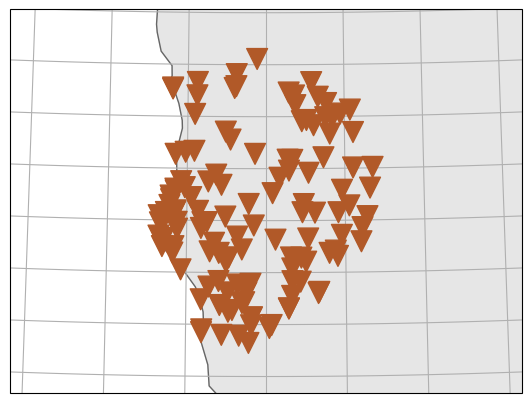

/Users/mdarifulislam/miniconda3/envs/obspy/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/mdarifulislam/miniconda3/envs/obspy/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


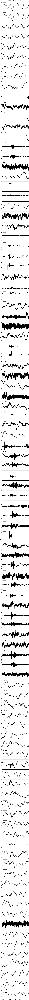

In [66]:
st = read(f'../data/eq_data/2_waveforms/test/mseed/nc51193680.mseed')
inv = obspy.read_inventory(f'../data/eq_data/2_waveforms/test/stationxml/nc51193680.xml')
inv.plot(projection='local', resolution='i', label=False);
st[0:5].plot(equal_scale=False);

In [74]:
# use Mass Downloader
import obspy
from obspy.clients.fdsn.mass_downloader import CircularDomain, \
    Restrictions, MassDownloader

ncedc_eqcat_df = pd.read_csv(f'../data/NCEDC_picks/NCEDC_eq_cat_above_slab.csv')#.groupby('event_id')
preffered_channels = ['HHZ', 'BHZ', 'HNZ', 'EHZ', 'SHZ', 'DPZ', 'SLZ', 'CNZ', 'HN3', 'HH3', 'ENZ']

for i, row in ncedc_eqcat_df[:1].iterrows():
    origin_time = UTCDateTime(row.etime)
    domain = CircularDomain(
        latitude=row.elat, longitude=row.elon, 
        minradius=0.0, maxradius=1.5)   
    
    restrictions = Restrictions(
        starttime=origin_time - 30,
        endtime=origin_time + 120,
        reject_channels_with_gaps=True,
        minimum_length=0.95,
        channel_priorities=preffered_channels)
    mdl = MassDownloader(providers=["NCEDC", "IRIS"])
    mdl.download(
        domain, restrictions,
        mseed_storage=f'.temp/waveforms',
        stationxml_storage=f'.temp/stationxmls')
    

[2024-05-23 01:26:52,053] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for NCEDC, IRIS.
[2024-05-23 01:26:52,053] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for NCEDC, IRIS.
[2024-05-23 01:26:52,057] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 2 client(s): NCEDC, IRIS.
[2024-05-23 01:26:52,057] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 2 client(s): NCEDC, IRIS.
[2024-05-23 01:26:52,058] - obspy.clients.fdsn.mass_downloader - INFO: Total acquired or preexisting stations: 0
[2024-05-23 01:26:52,058] - obspy.clients.fdsn.mass_downloader - INFO: Total acquired or preexisting stations: 0
[2024-05-23 01:26:52,059] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Requesting unreliable availability.
[2024-05-23 01:26:52,059] - obspy.clients.fdsn.mass_downloader - INFO: Client 'NCEDC' - Requesting unreliable availability.
[2024-05-23 01:27:07,224] - obspy.clients.fdsn.mas

85
85
Inventory created at 2024-05-23T05:31:26.425676Z
	Created by: ObsPy 1.4.0
		    https://www.obspy.org
	Sending institution: None
	Contains:
		Networks (4):
			BK, NC, PB, XQ
		Stations (85):
			BK.GASB ()
			BK.JCC ()
			BK.WDC ()
			BK.YBH ()
			NC.GBB ()
			NC.GHM ()
			NC.GRO ()
			NC.GTC ()
			NC.GVV ()
			NC.KBN ()
			NC.KBS ()
			NC.KCPB ()
			NC.KCR ()
			NC.KCS ()
			NC.KCT ()
			NC.KFP ()
			NC.KHBB ()
			NC.KHMB ()
			NC.KIP ()
			NC.KJJ ()
			NC.KKP ()
			NC.KMPB ()
			NC.KMR ()
			NC.KOM ()
			NC.KPP ()
			NC.KRK ()
			NC.KRMB ()
			NC.KRP ()
			NC.KSM ()
			NC.KSXB ()
			NC.KTR ()
			NC.LAM ()
			NC.LBF ()
			NC.LBK ()
			NC.LBO ()
			NC.LBP ()
			NC.LCSB ()
			NC.LDB ()
			NC.LGB ()
			NC.LGP ()
			NC.LHE ()
			NC.LMP ()
			NC.LPG ()
			NC.LPK ()
			NC.LRB ()
			NC.LSF ()
			NC.LSH ()
			NC.LSR ()
			NC.LTC ()
			NC.LVR ()
			NC.LWH ()
			PB.B039 ()
			PB.B040 ()
			XQ.ME01 ()
			XQ.ME02 ()
			XQ.ME03 ()
			XQ.ME04 ()
			XQ.ME05 ()
			XQ.ME07 ()
			XQ.ME08 ()
			XQ.

/Users/mdarifulislam/miniconda3/envs/obspy/lib/python3.10/site-packages/obspy/imaging/util.py:266: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small')
/Users/mdarifulislam/miniconda3/envs/obspy/lib/python3.10/site-packages/obspy/imaging/waveform.py:815: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  plt.setp(ax.get_xticklabels(), fontsize='small',


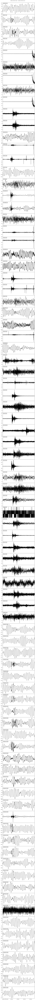

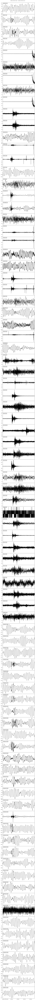

In [78]:
import glob
from obspy import read_inventory, Inventory

files = glob.glob('.temp/waveforms' + '/*.mseed')
xml_files = glob.glob('.temp/stationxmls' + '/*.xml')

# Read each file into a Stream object
st = Stream()
inv = Inventory()

for file in files:
    stream = read(file)
    st += stream
for xml_file in xml_files:
    inventory = read_inventory(xml_file)
    inv.extend(inventory)
inv.write('./temp.txt', 'STATIONTXT')
inv = pd.read_csv('./temp.txt', delimiter='|').drop_duplicates(subset=['#Network', 'Station', 'Location', 'Channel'])
inv.to_csv('./temp.txt', sep='|', header=True, index=False)
inv = obspy.read_inventory('./temp.txt', format='STATIONTXT')
os.remove('./temp.txt')

print(len(st))
print(len(inv.get_contents()['stations']))
print(inv)
st.plot(equal_scale=False)